## ART



Summary:

**Network used for transfer learnign**

Pre-trained Networks: ResNet101
ResNet-101 is a convolutional neural network that is 50 layers deep. You can load a pretrained version of the network trained on more than a million images from the ImageNet database. The pretrained network can classify images into 1000 object categories, such as keyboard, mouse, pencil, and many animals. As a result, the network has learned rich feature representations for a wide range of images. The network has an image input size of 224-by-224.

***Dataset**:
20% trai set (that is a total of 3284 images)

80% test set (that is a total of 821 images)

With Data Augmentation


**Parameters:**
- Pytorch Library
- Adam Optimizer
- Adam algorithm used  0.001, 0.9, 0.999, 1e-8 for initial learning rate, β_1, β_2, and ε, respectively.
- 40 iterations (backpropagation)
- No Data Augmentation. The performance didnt improve with Data augmentation
- Best Performance at iteration 35th with an accuracy of ~0.67, and loss of ~1.99 when the training set had achieved an accuracy of ~0.73 wiht a loss of 0.59.



In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# assigning directory
os.chdir('/content/drive/MyDrive/Project_5')

In [9]:
import numpy as np
import os
import sys
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import  transforms
from torch.autograd import Variable
import torch.distributed as dist
import torchvision
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.utils import shuffle
import collections
import imgaug.augmenters as iaa
import random
from sklearn.model_selection import train_test_split
import math
from mpl_toolkits.axes_grid1 import ImageGrid
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
import matplotlib.pyplot as plt


import pickle
import pickle5 as pickle
from sklearn import svm
from sklearn.ensemble import AdaBoostClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from keras.preprocessing.image import ImageDataGenerator,array_to_img, img_to_array, load_img 
from keras.preprocessing.image import ImageDataGenerator


## **DATA LOADING**


In [6]:
!pip install pickle5

     |████████████████████████████████| 133kB 13.8MB/s 
  Created wheel for pickle5: filename=pickle5-0.0.11-cp36-cp36m-linux_x86_64.whl size=218616 sha256=a5cd98b99dfdf8863fb83cec470abd15b3585fd421b746afd7fa9d36d53d59f5
  Stored in directory: /root/.cache/pip/wheels/a6/90/95/f889ca4aa8b0e0c7f21c8470b6f5d6032f0390a3a141a9a3bd
Successfully built pickle5


In [10]:
pickleFile = open('/content/drive/MyDrive/Project_5/images_reduced_array.pickle', 'rb')
X_data= pickle.load(pickleFile)
pickleFile.close()

pickleFile = open('/content/drive/MyDrive/Project_5/labels.pickle', 'rb')
Y_data0= pickle.load(pickleFile)
pickleFile.close()

Y_data=[]
for y in Y_data0:
  Y_data.append(int(y))

In [11]:
##TO DIVIDE THE SET INTO TRAINING AND TESTING
training_size= 0.80
x_train= []
y_train= []
x_test= []
y_test= []
perm = np.random.permutation(len(X_data))
N= int(training_size*len(X_data))
for i in range(0,N):
  x_train.append(X_data[perm[i]])
  y_train.append(Y_data[perm[i]])

for i in range(N,len(X_data)):
  x_test.append(X_data[perm[i]])
  y_test.append(Y_data[perm[i]])

print ('Train Len: ', len(x_train))
print ('Test Len: ', len(x_test))

## we are using transfer learning, so we need to use the mean and std deviation of the dataset used for training. IMAGENET is the name of the dataset.  
mean = np.asarray([0.485, 0.456, 0.406],np.float32)
std = np.asarray([0.229, 0.224, 0.225],np.float32)

# x_trainset, y_trainset = shuffle(x_trainset, y_trainset)


Train Len:  3284
Test Len:  821


## **Data Management - helper functions**

In [12]:
def augment(frame):
  random_noise= np.random.randint(2)
  random_crop = np.random.randint(2)
  random_rotate= np.random.randint(2)
  random_shearing = np.random.randint(2)
  random_flip = np.random.randint(2)
  random_brightness = np.random.randint(2)
  random_scaling= np.random.randint(2)
  random_translation= np.random.randint(2)

  if (random_noise):
      gaussian_noise=iaa.AdditiveGaussianNoise(10,20)
      frame=gaussian_noise.augment_image(frame)

  if (random_crop):
      crop = iaa.Crop(percent=(0, random.uniform(0,0.4)))
      frame= crop.augment_image(frame)

  if (random_rotate):
      rotate=iaa.Affine(rotate=(0, random.randint(0,50)))
      frame=rotate.augment_image(frame)

  #if (random_translation):
  #    frame= translation(frame)

  if (random_shearing):
      shear = iaa.Affine(shear=(np.random.randint(0,30)))
      frame=shear.augment_image(frame)

  if (random_flip):
      frame= cv2.flip(frame, -1)

  if (random_brightness):
      frame[frame<0]= 0.0
      contrast=iaa.GammaContrast(gamma=random.uniform(0.5,1.8))
      frame= contrast.augment_image(frame)

  if (random_scaling):
      scale_im=iaa.Affine(scale={"x": (np.random.randint(1,2), 1.0), "y": (np.random.randint(1,2), 1.0)})
      frame =scale_im.augment_image(frame)   

  return (frame)


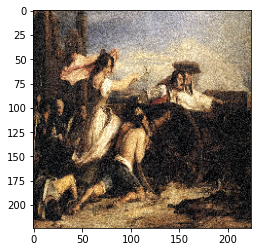

In [13]:
#checking data augmentation before applying
frame = X_data[4]
gaussian_noise=iaa.AdditiveGaussianNoise(10,20)
frame=gaussian_noise.augment_image(frame)
plt.imshow(frame)

In [14]:
def loadingframes (x, aug= True):
    frames_x= []
    for  frame in x:
        frame = frame.astype(np.float32)
        if aug== True:
          frame= augment(frame)
        frame[frame>255]= 255.0
        frame[frame<0]= 0.0
        frame= frame/255.0
        frame = (frame - mean)/std
        frame = frame.transpose(2,0,1)
        frames_x.append(frame)
    
    return (frames_x)

In [15]:
def conversion (frame):
    kk = []
    kk.append(frame)
    kk= np.asarray(kk)
    return (kk)   


## LOADING MODEL -- Fourth Layer 




In [16]:
device= torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [33]:
model = torchvision.models.resnet101(pretrained=True)
model

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [20]:
NUM_CLASSES= 3
model.fc = nn.Linear(2048,NUM_CLASSES)
# for param in model.parameters():
#     param.requires_grad_(False)
# # for param in model.conv1.parameters():
#   # param.requires_grad_(True)
# # for param in model.bn1.parameters():
#   # param.requires_grad_(True)
# # for param in model.layer1.parameters():
#   # param.requires_grad_(True)
# # for param in model.layer2.parameters():
# #   # param.requires_grad_(True)
# for param in model.layer3[4].parameters():
  # param.requires_grad_(True)
for param in model.layer4.parameters():
    param.requires_grad_(True)
for param in model.fc.parameters():
    param.requires_grad_(True)

params = []
# # for param in model.conv1.parameters():
#   # params.append(param)
# # for param in model.bn1.parameters():
#   # params.append(param)
# # for param in model.layer1.parameters():
#   # params.append(param)
# # for param in model.layer2.parameters():
#   # params.append(param)
# # for param in model.layer3[4].parameters():
# #   params.append(param)
for param in model.layer4.parameters():
    params.append(param)
for param in model.fc.parameters():
    params.append(param)

model.to(device)
lr= 0.001
batch_size= 10
optimizer = optim.Adam(params,lr=lr)
criterion = nn.CrossEntropyLoss()

In [21]:
import time
summary= {}
num_of_epochs= 40
train_accu_epochs  = []
train_loss_epochs = []
test_accu_epochs  = []
test_loss_epochs =[]

for epoch in range(0,num_of_epochs):
    ###### TRAIN
    train_accu = []
    train_loss= []
    model.train()
    I_permutation = np.random.permutation(len(x_train))    
    start_time = time.time()
    
    for i in range(0, len(x_train),batch_size):
        x_input = [x_train[j] for j in I_permutation[i:i+batch_size]]
        x_input =loadingframes(x_input, aug= True )
        y_input = np.asarray([y_train[j] for j in I_permutation[i:i+batch_size]],dtype=np.int)
        target = Variable(torch.LongTensor(y_input)).to(device)
        x_input= Variable(torch.FloatTensor(x_input)).to(device).contiguous()

        
        output = model(x_input)
        loss = criterion(output, target)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        prediction = output.data.max(1)[1]
        accuracy = (float(prediction.eq(target).sum() ) /float(len(y_input)))*100.0   
        train_accu.append(accuracy)
        train_loss.append(np.asarray((loss.detach().cpu())))

        
    accuracy_epoch = np.mean(train_accu)
    train_accu_epochs.append(accuracy_epoch)
    train_loss_epochs.append(np.mean(train_loss))

    print('At Epoch:', epoch, 'Training Accuracy:' , accuracy_epoch, 'Loss' , np.mean(train_loss),'time:', time.time()-start_time)

    ##TEST
    model.eval()
    accuracy= 0
    # test_accu = []
    I_permutation = np.random.permutation(len(x_test))    
    test_accu= []
    test_loss= []
    for i in range(0, len(x_test),batch_size):
        x_input = [x_test[j] for j in I_permutation[i:i+batch_size]]
        x_input = loadingframes(x_input, aug= False)
        y_input = np.asarray([y_test[j] for j in I_permutation[i:i+batch_size]],dtype=np.int)
        target = Variable(torch.LongTensor(y_input)).to(device)
        x_input= Variable(torch.FloatTensor(x_input)).to(device).contiguous()    
        
        with torch.no_grad():
            h = model.conv1(x_input)
            h = model.bn1(h)
            h = model.relu(h)
            h = model.maxpool(h)
            h = model.layer1(h)
            h = model.layer2(h)
            h = model.layer3(h)
            h = model.layer4(h)
            h = model.avgpool(h)
        
            h = h.view(h.size(0), -1)
            output = model.fc(h)
       
        loss = criterion(output,target)
        prediction = output.data.max(1)[1]
        accuracy = (float(prediction.eq(target).sum() ) /float(len(y_input)))*100.0
     
        test_accu.append(accuracy)
        test_loss.append(loss.item())


    accuracy_epoch= np.mean(test_accu)
    print('At Epoch:', epoch, 'Testing:' , np.mean(test_accu), 'Loss' , np.mean(test_loss),'time:', time.time()-start_time)
    print ( '')

    test_accu_epochs.append(np.mean(test_accu))
    test_loss_epochs.append(np.mean(test_loss))


    summary['train_accu_epochs'] = train_accu_epochs
    summary['train_loss_epochs'] = train_accu_epochs
    summary['test_accu_epochs'] = test_accu_epochs
    summary['test_loss_epochs'] = test_loss_epochs 
    
    pickleFile = open('/content/drive/MyDrive/Project_5/models/summary.pickle', 'wb')
    pickle.dump(summary,pickleFile,pickle.HIGHEST_PROTOCOL)
    pickleFile.close()
    
    torch.save(model.state_dict(), '/content/drive/MyDrive/Project_5/models/resnet101_4Layer_' + str(epoch))


    if np.mean(test_accu)>65:
        torch.save(model.state_dict(), '/content/drive/MyDrive/Project_5/models/resnet101_4Layer_' + str(epoch))


summary['train_accu_epochs'] = train_accu_epochs
summary['train_loss_epochs'] = train_accu_epochs
summary['test_accu_epochs'] = test_accu_epochs
summary['test_loss_epochs'] = test_loss_epochs 


pickleFile = open('/content/drive/MyDrive/Project_5/models/summary.pickle', 'wb')
pickle.dump(summary,pickleFile,pickle.HIGHEST_PROTOCOL)
pickleFile.close()
    


torch.save(model.state_dict(), '/content/drive/MyDrive/Project_5/models/resnet101_4Layer_' + str(epoch))

At Epoch: 0 Training Accuracy: 52.537993920972646 Loss 0.993554 time: 119.19303846359253
At Epoch: 0 Testing: 68.79518072289157 Loss 0.7317457015973976 time: 134.13532090187073

At Epoch: 1 Training Accuracy: 58.10030395136778 Loss 0.894714 time: 119.0574631690979
At Epoch: 1 Testing: 69.63855421686748 Loss 0.709878633023206 time: 134.2812922000885

At Epoch: 2 Training Accuracy: 60.56231003039514 Loss 0.8659167 time: 117.76931619644165
At Epoch: 2 Testing: 69.51807228915662 Loss 0.7135145007127739 time: 132.92679905891418

At Epoch: 3 Training Accuracy: 59.52887537993921 Loss 0.8531061 time: 120.02798390388489
At Epoch: 3 Testing: 69.27710843373494 Loss 0.7361893671822836 time: 135.37372946739197

At Epoch: 4 Training Accuracy: 61.09422492401216 Loss 0.84554005 time: 119.66570496559143
At Epoch: 4 Testing: 68.19277108433735 Loss 0.7567860783941774 time: 134.9592456817627

At Epoch: 5 Training Accuracy: 60.911854103343465 Loss 0.83585364 time: 118.9317090511322
At Epoch: 5 Testing: 69.

## TO plot

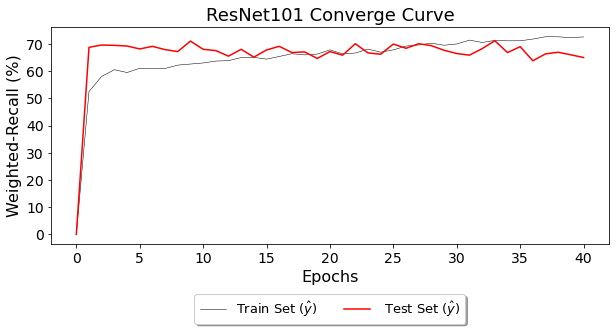

In [22]:
fig= plt.figure(figsize=(10,4))
x= list(range(0,40+1))
plt.plot(x,[0]+summary ['train_accu_epochs'], 'black',linewidth=0.5,  label= 'Train Set ($\hat {y}$)')
plt.plot(x,[0]+summary['test_accu_epochs'], 'r', label= ' Test Set ($\hat {y}$)')

plt.title('ResNet101 Converge Curve', fontsize=18)

plt.xlabel('Epochs', fontsize= 16)
plt.ylabel('Weighted-Recall (%)', fontsize= 16)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), shadow=True, ncol=4, fontsize= 13)


In [25]:
##PERFORMANCE METRICS
#model.load_state_dict(torch.load('/content/drive/MyDrive/Project_5/models/resnet101_4Layer_39')) #INSERT YOUR MODEL IF YOU WANT TO CHANGE THE ONE IS LOADED IN MEMORY
model.eval()

confusion_matrix = np.zeros((3,3))
wrong= []
prediction= []
original= []
count = 0
c=0
test_loss=[]
good=[]

for frame, label in zip(x_test, y_test):
        frame = frame.astype(np.float32)
        frame= frame/255.0
        frame = (frame - mean)/std
        frame = frame.transpose(2,0,1)
        frame= conversion(frame)
        x_input= Variable(torch.FloatTensor(frame)).to(device).contiguous()
        target = conversion(label)
        target = Variable(torch.LongTensor(target)).to(device)

        with torch.no_grad():
          h = model.conv1(x_input)
          h = model.bn1(h)
          h = model.relu(h)
          h = model.maxpool(h)
          h = model.layer1(h)
          h = model.layer2(h)
          h = model.layer3(h)
          h = model.layer4(h)
          h = model.avgpool(h)
          h = h.view(h.size(0), -1)
          output = model.fc(h)

        y_prediction= output.cpu().numpy()
        y_prediction = np.argsort(-y_prediction)
        
        loss = criterion(output,target)
        test_loss.append(loss.item())
        
        if y_prediction[0][0]== label:
            count = count +1
            good.append(c)
        else:
          original.append(label)
          prediction.append(y_prediction[0][0])
          wrong.append(c)
        
        confusion_matrix[label, y_prediction[0][0]] += 1
        c= c+ 1

accuracy = count/(len(y_test))
##CHECK THIS ACCURACY WITH THE MODEL
print ('Accuracy: ', accuracy)
print ('Loss: ', np.mean(test_loss))


Accuracy:  0.6577344701583435
Loss:  1.047472262003555


# WRONG PREDICTION _ PRINTING

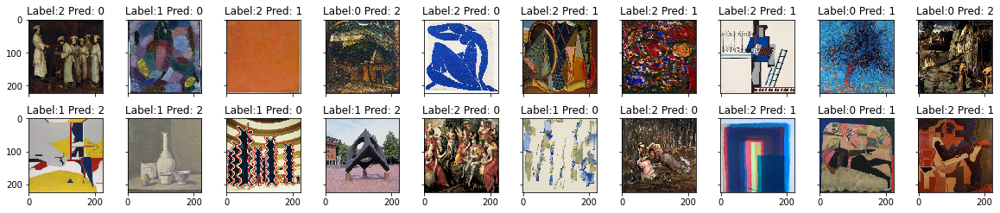

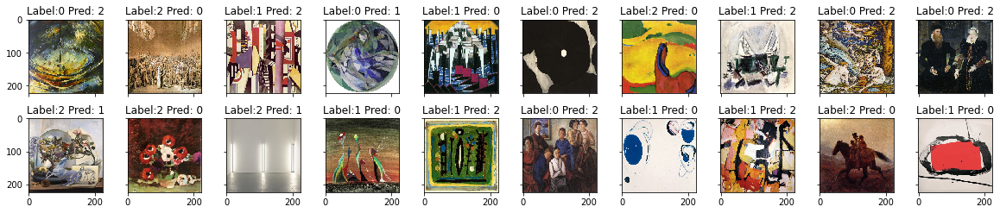

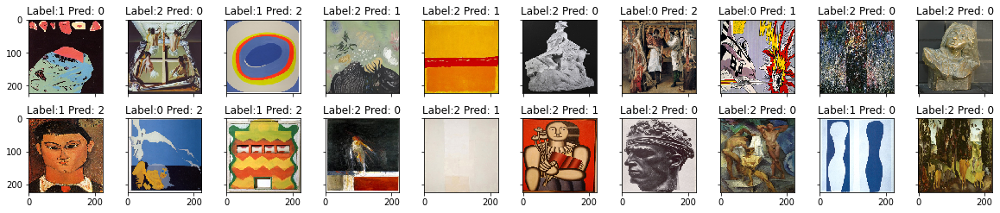

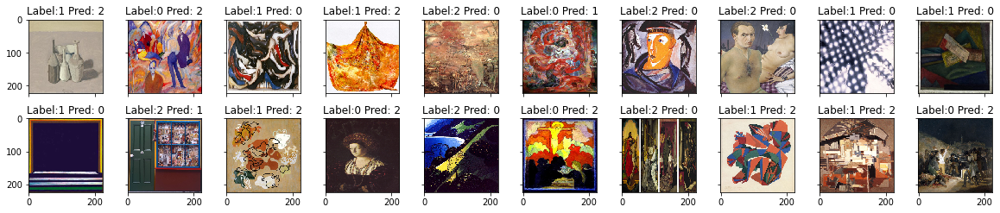

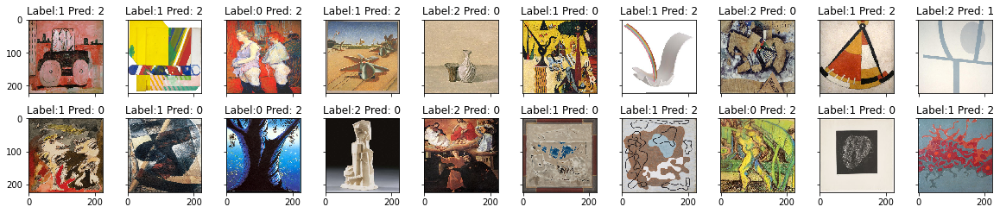

...

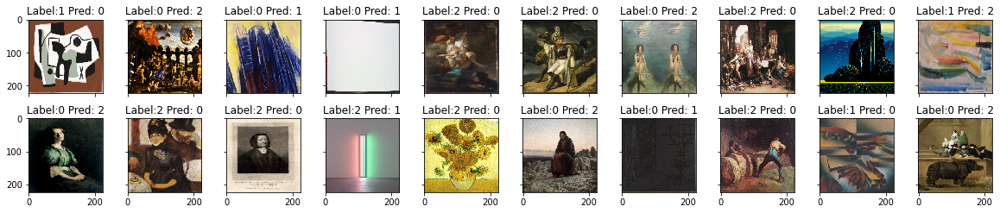

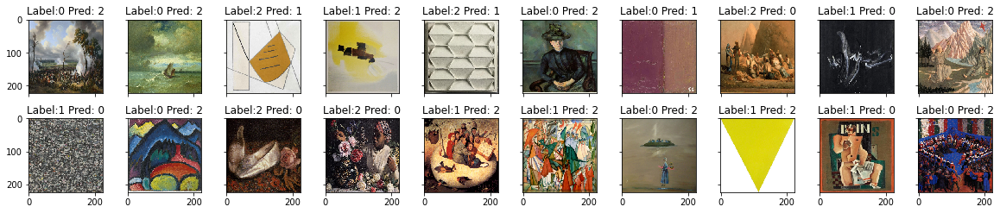

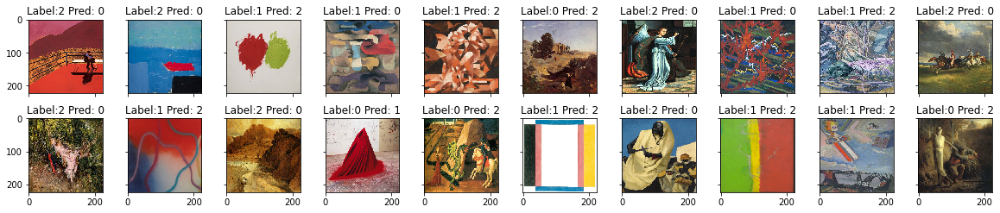

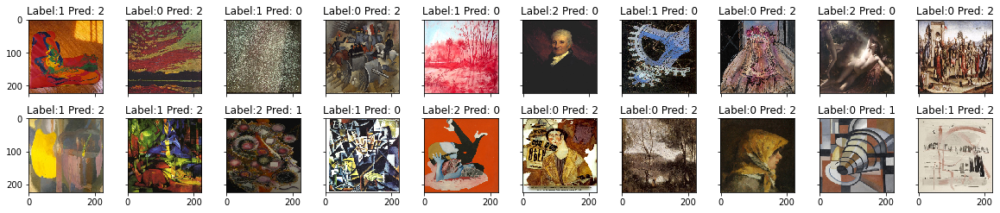

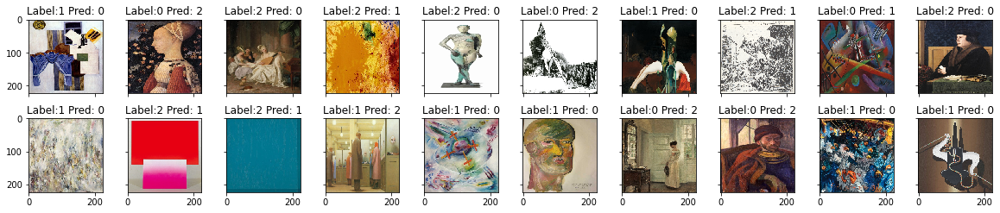

In [26]:
images= []
labels =[]
pre=[]
kk= 0
for i in range (0, len(wrong)):
      pos= wrong[i]
      img = x_test[pos]
      images.append(img)
      labels.append(original[i])
      pre.append(prediction[i])

      if i !=0 and i%20 ==0:

        fig = plt.figure(figsize=(20,20))
        grid = ImageGrid(fig, 111,  # similar to subplot(111)
                          nrows_ncols=(2, 10),  # creates 2x2 grid of axes
                          axes_pad=0.4) # pad between axes in inch.)
        for ax, im, lab,p in zip(grid, images, labels, pre):
            # Iterating over the grid returns the Axes.
            ax.imshow(im, interpolation='none')
            ax.set_title('Label:' + str(lab) + ' Pred: ' + str(p))
        plt.show()
        images= []
        labels= []
        pre= []


# GOOD_PREDICTION

In [34]:
#images= []
#labels =[]
#kk= 0
#for i in range (0, len(good)):
#      pos= good[i]
#      img = x_test[pos]
#      images.append(img)
#      labels.append(y_test[i])
#      # pre.append(prediction[i])

#    if i !=0 and i%50 ==0:

#        fig = plt.figure(figsize=(20,20))
#        grid = ImageGrid(fig, 111,  # similar to subplot(111)
#                          nrows_ncols=(5, 10),  # creates 2x2 grid of axes
#                          axes_pad=0.4) # pad between axes in inch.)
#        for ax, im, lab in zip(grid, images, labels):
#            # Iterating over the grid returns the Axes.
#            ax.imshow(im, interpolation='none')
#            ax.set_title('Label:' + str(lab) )
#        plt.show()
#        images= []
#        labels= []
#       pre= []

#Not showing the good predictions output to reduce the size of the notebook, so it can be uploaded to github


In [28]:
import pandas as pd
df= pd.DataFrame(confusion_matrix)
index= ['Class0', 'Class1', 'Class3']
column= ['Class0', 'Class1', 'Class3']
diagonal = np.diagonal(confusion_matrix)
pd.DataFrame(np.diag(df), index=[df.index, df.columns])
# df['correct'] = diagonal
df['samples_sum'] = df.sum(axis=1) 
df['correct'] = diagonal
df['PERFORMANCE'] = df['correct']/df['samples_sum']
df.drop(['samples_sum','correct'], axis= 1, inplace= True)
df
df['predicted_counts'] = df.sum(axis = 0)
df['samples_class'] = df.sum(axis=1)
df['precision']= diagonal/df['predicted_counts']
df['F-score'] = (2*(df['precision']*df['PERFORMANCE']))/(df['precision'] + df['PERFORMANCE'])
df

,0,1,2,PERFORMANCE,predicted_counts,samples_class,precision,F-score
0,107.0,15.0,58.0,0.594444,232.0,412.594444,0.461207,0.519417
1,45.0,135.0,52.0,0.581897,181.0,413.581897,0.745856,0.653753
2,80.0,31.0,298.0,0.728606,408.0,817.728606,0.730392,0.729498


In [29]:
N= df['samples_class'].sum()
weighted_recall = ((df['PERFORMANCE']*df['samples_class']).sum())/N
weighted_precision= ((df['precision']*df['samples_class']).sum())/N
weighted_fscore= ((df['F-score']*df['samples_class']).sum())/N
print ('W-recall :', weighted_recall )
print ('W-precision :', weighted_precision )
print ('W-fscore :', weighted_fscore )

W-recall : 0.6580238214963491
W-precision : 0.6667214249949447
W-fscore : 0.6577148515826603


#IMAGES_MOVIES

In [32]:
movies= os.listdir('/content/drive/MyDrive/Project_5/Movie_Images/')
prediction = []
for i in movies:
    print (i)
    path = '/content/drive/MyDrive/Project_5/Movie_Images/' + str(i)
    img= cv2.imread(path)
    img= cv2.resize(img, (224,224))
    frame= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    frame = frame.astype(np.float32)
    frame= frame/255.0
    frame = (frame - mean)/std
    frame = frame.transpose(2,0,1)
    frame= conversion(frame)
    x_input= Variable(torch.FloatTensor(frame)).to(device).contiguous()
    
    with torch.no_grad():
        h = model.conv1(x_input)
        h = model.bn1(h)
        h = model.relu(h)
        h = model.maxpool(h)
        h = model.layer1(h)
        h = model.layer2(h)
        h = model.layer3(h)
        h = model.layer4(h)
        h = model.avgpool(h)
        h = h.view(h.size(0), -1)
        output = model.fc(h)

    y_prediction= output.cpu().numpy()
    y_prediction = np.argsort(-y_prediction)
    prediction.append(y_prediction[0][0])




image_1.jpg
image_2.jpg
image_3.jpg
image_4.jpg
image_5.jpg
image_6.jpg
image_7.jpg
image_8.jpg
image_9.jpg
image_10.jpg
image_11.jpg
image_12.jpg
image_13.jpg
image_14.jpg
image_15.jpg
image_16.jpg
image_17.jpg
image_18.jpg
image_19.jpg


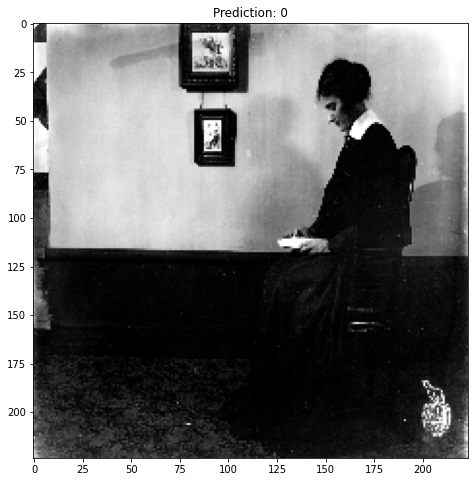

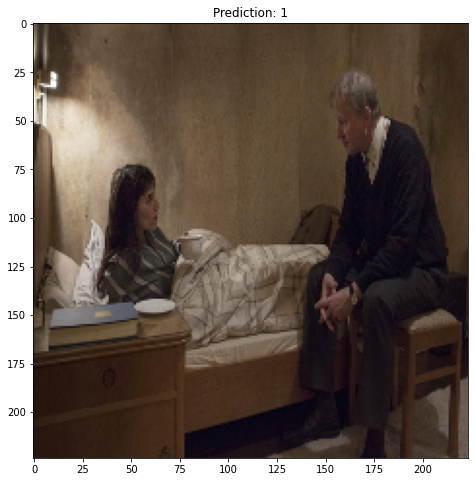

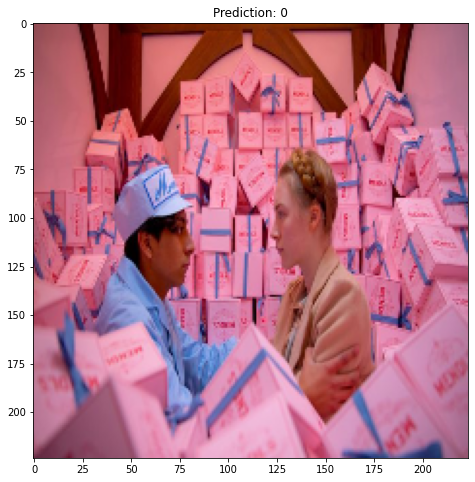

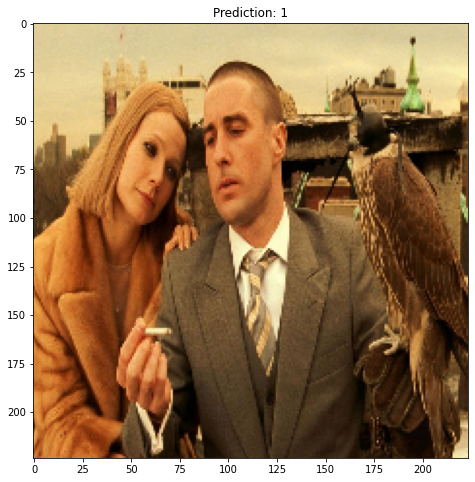

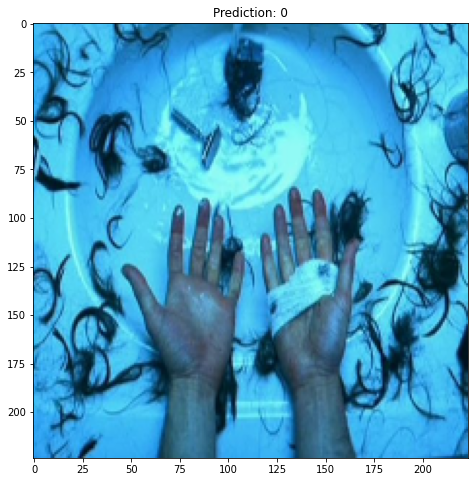

...

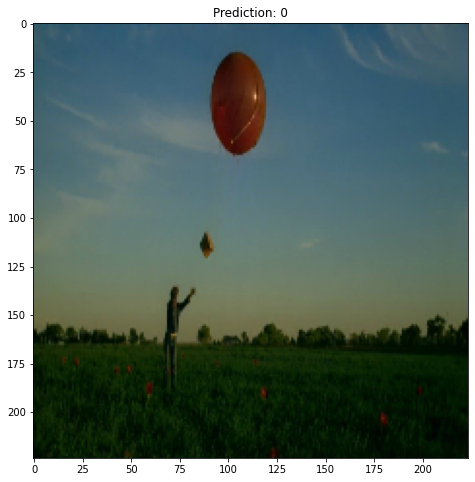

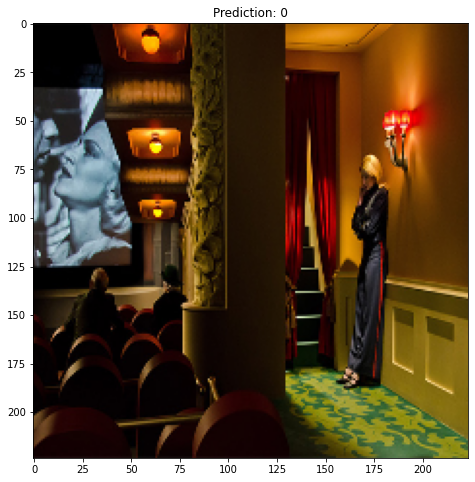

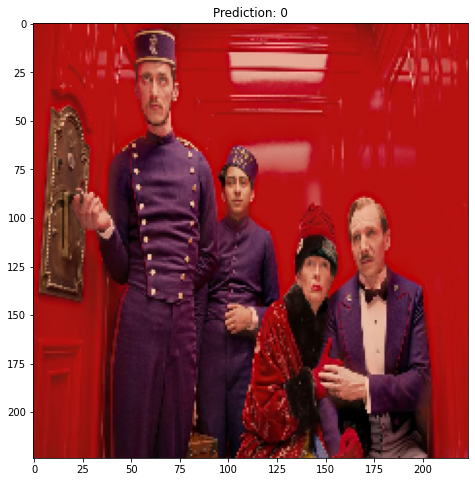

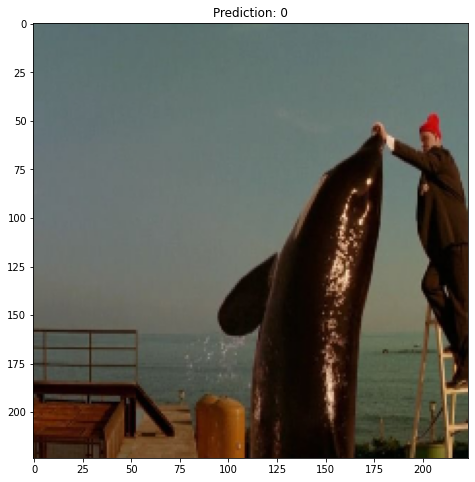

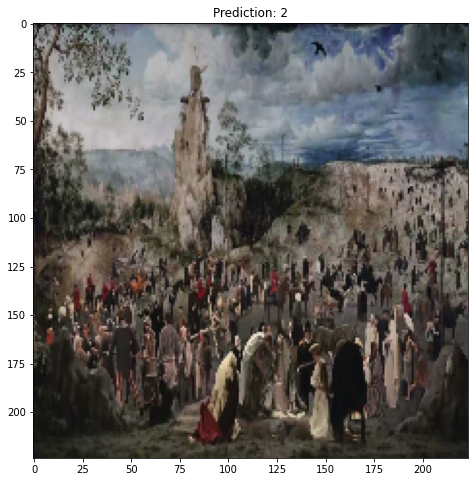

In [ ]:
kk= 0
for img, pred in zip(movies, prediction):
      path = '/content/drive/MyDrive/Laura/Movie_Images/' + str(img)
      frame= cv2.imread(path)
      frame= cv2.resize(frame, (224,224))
      frame= cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
      plt.figure(figsize=(8,8))
      plt.imshow(frame)
      plt.title('Prediction: ' + str(pred))
      plt.show()
